In [87]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [5]:
UScomments = pd.read_csv(r"C:\Users\HP\Desktop\Excel, SQL, Python, Power BI\Python\Projects\Realtime Projects\Youtube Case Study\Youtube_project_shan_singh\UScomments.csv", error_bad_lines = False)

C:\Users\HP\AppData\Local\Temp\ipykernel_8416\3206919447.py:1: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  UScomments = pd.read_csv(r"C:\Users\HP\Desktop\Excel, SQL, Python, Power BI\Python\Projects\Realtime Projects\Youtube Case Study\Youtube_project_shan_singh\UScomments.csv", error_bad_lines = False)
b'Skipping line 41589: expected 4 fields, saw 11\nSkipping line 51628: expected 4 fields, saw 7\nSkipping line 114465: expected 4 fields, saw 5\n'
b'Skipping line 142496: expected 4 fields, saw 8\nSkipping line 189732: expected 4 fields, saw 6\nSkipping line 245218: expected 4 fields, saw 7\n'
b'Skipping line 388430: expected 4 fields, saw 5\n'
C:\Users\HP\AppData\Local\Temp\ipykernel_8416\3206919447.py:1: DtypeWarning: Columns (2,3) have mixed types. Specify dtype option on import or set low_memory=False.
  UScomments = pd.read_csv(r"C:\Users\HP\Desktop\Excel, SQL, Python, Power BI\Python\P

In [6]:
UScomments.head(10)

,video_id,comment_text,likes,replies
0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼️‼️‼️,4,0
1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0
2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0
3,XpVt6Z1Gjjo,MY FAN . attendance,3,0
4,XpVt6Z1Gjjo,trending 😉,3,0
5,XpVt6Z1Gjjo,#1 on trending AYYEEEEE,3,0
6,XpVt6Z1Gjjo,The end though 😭👍🏻❤️,4,0
7,XpVt6Z1Gjjo,#1 trending!!!!!!!!!,3,0
8,XpVt6Z1Gjjo,Happy one year vlogaversary,3,0
9,XpVt6Z1Gjjo,You and your shit brother may have single hand...,0,0


In [7]:
UScomments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 691400 entries, 0 to 691399
Data columns (total 4 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   video_id      691400 non-null  object
 1   comment_text  691375 non-null  object
 2   likes         691400 non-null  object
 3   replies       691400 non-null  object
dtypes: object(4)
memory usage: 21.1+ MB


In [8]:
UScomments.describe()

,video_id,comment_text,likes,replies
count,691400,691375,691400,691400
unique,2266,434076,1284,479
top,XpVt6Z1Gjjo,Lol,0,0
freq,800,310,456894,525730


#### Checking for null values and removing them

In [9]:
UScomments.isnull().sum()

video_id         0
comment_text    25
likes            0
replies          0
dtype: int64

In [10]:
UScomments.dropna(inplace = True)

#### Installing & importing textblob module to find the polarity of comments in youtube

In [11]:
!pip install textblob

In [12]:
from textblob import TextBlob

In [13]:
TextBlob("Great Course").sentiment

Sentiment(polarity=0.8, subjectivity=0.75)

#### Getting polarity of each comments & storing it into an empty list

In [14]:
pol = []

for comments in UScomments["comment_text"]:
    try:
        pol.append(TextBlob(comments).sentiment.polarity)
    except:
        pol.append(0)

#### Adding new column for polarity of comment

In [15]:
UScomments["Polarity"] = pol

In [16]:
UScomments

,video_id,comment_text,likes,replies,Polarity
0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼️‼️‼️,4,0,0.0
1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0,0.0
2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0,0.0
3,XpVt6Z1Gjjo,MY FAN . attendance,3,0,0.0
4,XpVt6Z1Gjjo,trending 😉,3,0,0.0
...,...,...,...,...,...
691395,EoejGgUNmVU,Лучшая,1,0,0.0
691396,EoejGgUNmVU,qu'est ce que j'aimerais que tu viennes à Roan...,0,0,0.0
691397,EoejGgUNmVU,Ven a mexico! 😍 te amo LP,0,0,0.0
691398,EoejGgUNmVU,Islığı yeter...,0,0,0.0


#### Creating Wordcloud for positive & negative comments

In [17]:
df1 = UScomments[UScomments['Polarity'] == 1]

In [18]:
df1

,video_id,comment_text,likes,replies,Polarity
64,XpVt6Z1Gjjo,yu are the best,1,0,1.0
156,cLdxuaxaQwc,Power is the disease. Care is the cure. Keep...,0,0,1.0
227,WYYvHb03Eog,YAS Can't wait to get it! I just need to sell ...,0,0,1.0
307,sjlHnJvXdQs,This is priceless,0,0,1.0
319,sjlHnJvXdQs,Summed up perfectly,0,0,1.0
...,...,...,...,...,...
691373,EoejGgUNmVU,Perfect. Every version,0,0,1.0
691383,EoejGgUNmVU,Me encantaaaaa <3,0,0,1.0
691388,EoejGgUNmVU,Best song ever 🤘,0,0,1.0
691389,EoejGgUNmVU,excellent performance,0,0,1.0


In [19]:
df2 = UScomments[UScomments['Polarity'] == -1]

In [20]:
!pip install wordcloud

In [21]:
from wordcloud import WordCloud, STOPWORDS

In [22]:
allcommentsp = " ".join(df1["comment_text"])

(-0.5, 399.5, 199.5, -0.5)

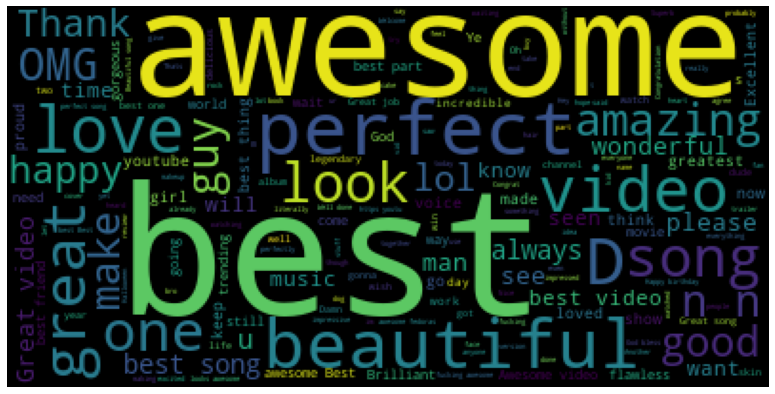

In [23]:
wordcloudp = WordCloud(stopwords = set(STOPWORDS)).generate(allcommentsp)
plt.figure(figsize=(20,7))
plt.imshow(wordcloudp)
plt.axis("off")

In [24]:
allcommentsn = " ".join(df2["comment_text"])

(-0.5, 399.5, 199.5, -0.5)

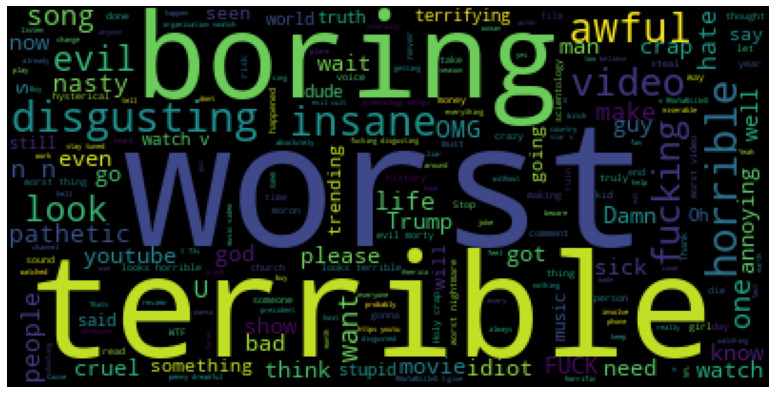

In [25]:
wordcloudn = WordCloud(stopwords = set(STOPWORDS)).generate(allcommentsn)
plt.figure(figsize=(20,7))
plt.imshow(wordcloudn)
plt.axis("off")

#### US & CA Youtube data (Only US & CA due to processor performance

In [26]:
US_data = pd.read_csv(r"C:\Users\HP\Desktop\Excel, SQL, Python, Power BI\Python\Projects\Realtime Projects\Youtube Case Study\Youtube_project_shan_singh\additional_data\USvideos.csv", error_bad_lines = False)

C:\Users\HP\AppData\Local\Temp\ipykernel_8416\664507314.py:1: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  US_data = pd.read_csv(r"C:\Users\HP\Desktop\Excel, SQL, Python, Power BI\Python\Projects\Realtime Projects\Youtube Case Study\Youtube_project_shan_singh\additional_data\USvideos.csv", error_bad_lines = False)


In [27]:
CA_data = pd.read_csv(r"C:\Users\HP\Desktop\Excel, SQL, Python, Power BI\Python\Projects\Realtime Projects\Youtube Case Study\Youtube_project_shan_singh\additional_data\CAvideos.csv", error_bad_lines = False)

C:\Users\HP\AppData\Local\Temp\ipykernel_8416\30212952.py:1: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  CA_data = pd.read_csv(r"C:\Users\HP\Desktop\Excel, SQL, Python, Power BI\Python\Projects\Realtime Projects\Youtube Case Study\Youtube_project_shan_singh\additional_data\CAvideos.csv", error_bad_lines = False)


In [28]:
US_data['Country'] = "US"
CA_data["Country"] = "CA"

In [29]:
full_data = pd.concat([US_data, CA_data])

In [30]:
full_data

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,Country
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,US
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",US
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,US
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...,US
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,US
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40876,sGolxsMSGfQ,18.14.06,HOW2: How to Solve a Mystery,Annoying Orange,24,2018-06-13T18:00:07.000Z,"annoying orange|""funny""|""fruit""|""talking""|""ani...",80685,1701,99,1312,https://i.ytimg.com/vi/sGolxsMSGfQ/default.jpg,False,False,False,🚨 NEW MERCH! http://amzn.to/annoyingorange 🚨➤ ...,CA
40877,8HNuRNi8t70,18.14.06,Eli Lik Lik Episode 13 Partie 01,Elhiwar Ettounsi,24,2018-06-13T19:01:18.000Z,"hkayet tounsia|""elhiwar ettounsi""|""denya okhra...",103339,460,66,51,https://i.ytimg.com/vi/8HNuRNi8t70/default.jpg,False,False,False,► Retrouvez vos programmes préférés : https://...,CA
40878,GWlKEM3m2EE,18.14.06,KINGDOM HEARTS III – SQUARE ENIX E3 SHOWCASE 2...,Kingdom Hearts,20,2018-06-11T17:30:53.000Z,"Kingdom Hearts|""KH3""|""Kingdom Hearts 3""|""Froze...",773347,25900,224,3881,https://i.ytimg.com/vi/GWlKEM3m2EE/default.jpg,False,False,False,Find out more about Kingdom Hearts 3: https://...,CA
40879,lbMKLzQ4cNQ,18.14.06,Trump Advisor Grovels To Trudeau,The Young Turks,25,2018-06-13T04:00:05.000Z,"180612__TB02SorryExcuse|""News""|""Politics""|""The...",115225,2115,182,1672,https://i.ytimg.com/vi/lbMKLzQ4cNQ/default.jpg,False,False,False,Peter Navarro isn’t talking so tough now. Ana ...,CA


### Category wise analysis

#### Getting category file to compare with category ID

In [31]:
cat_list = pd.read_csv(r"C:\Users\HP\Desktop\Excel, SQL, Python, Power BI\Python\Projects\Realtime Projects\Youtube Case Study\Youtube_project_shan_singh\category_file.txt", sep = ":")

In [32]:
cat_list

,Category_id Category_name
1,Film & Animation
2,Autos & Vehicles
10,Music
15,Pets & Animals
17,Sports
18,Short Movies
19,Travel & Events
20,Gaming
21,Videoblogging
22,People & Blogs


#### Creating dictionary & mapping it

In [33]:
cat = {1:"Film & Animation", 2:"Autos & Vehicles", 10:"Music", 15:"Pets & Animals", 17:"Sports", 18:"Short Movies",
19:"Travel & Events",
20:"Gaming",
21:"Videoblogging",
22:"People & Blogs",
23:"Comedy",
24:"Entertainment",
25:"News & Politics",
26:"Howto & Style",
27:"Education",
28:"Science & Technology",
29:"Nonprofits & Activism",
30:"Movies",
31:"Anime/Animation",
32:"Action/Adventure",
33:"Classics",
34:"Comedy",
35:"Documentary",
36:"Drama",
37:"Family",
38:"Foreign",
39:"Horror",
40:"Sci-Fi/Fantasy",
41:"Thriller",
42:"Shorts",
43:"Shows",
44:"Trailers"}

In [34]:
full_data["Category"] = full_data["category_id"].map(cat)

In [35]:
full_data

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,Country,Category
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,US,People & Blogs
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",US,Entertainment
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,US,Comedy
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...,US,Entertainment
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,US,Entertainment
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40876,sGolxsMSGfQ,18.14.06,HOW2: How to Solve a Mystery,Annoying Orange,24,2018-06-13T18:00:07.000Z,"annoying orange|""funny""|""fruit""|""talking""|""ani...",80685,1701,99,1312,https://i.ytimg.com/vi/sGolxsMSGfQ/default.jpg,False,False,False,🚨 NEW MERCH! http://amzn.to/annoyingorange 🚨➤ ...,CA,Entertainment
40877,8HNuRNi8t70,18.14.06,Eli Lik Lik Episode 13 Partie 01,Elhiwar Ettounsi,24,2018-06-13T19:01:18.000Z,"hkayet tounsia|""elhiwar ettounsi""|""denya okhra...",103339,460,66,51,https://i.ytimg.com/vi/8HNuRNi8t70/default.jpg,False,False,False,► Retrouvez vos programmes préférés : https://...,CA,Entertainment
40878,GWlKEM3m2EE,18.14.06,KINGDOM HEARTS III – SQUARE ENIX E3 SHOWCASE 2...,Kingdom Hearts,20,2018-06-11T17:30:53.000Z,"Kingdom Hearts|""KH3""|""Kingdom Hearts 3""|""Froze...",773347,25900,224,3881,https://i.ytimg.com/vi/GWlKEM3m2EE/default.jpg,False,False,False,Find out more about Kingdom Hearts 3: https://...,CA,Gaming
40879,lbMKLzQ4cNQ,18.14.06,Trump Advisor Grovels To Trudeau,The Young Turks,25,2018-06-13T04:00:05.000Z,"180612__TB02SorryExcuse|""News""|""Politics""|""The...",115225,2115,182,1672,https://i.ytimg.com/vi/lbMKLzQ4cNQ/default.jpg,False,False,False,Peter Navarro isn’t talking so tough now. Ana ...,CA,News & Politics


In [36]:
full_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 81830 entries, 0 to 40880
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   video_id                81830 non-null  object
 1   trending_date           81830 non-null  object
 2   title                   81830 non-null  object
 3   channel_title           81830 non-null  object
 4   category_id             81830 non-null  int64 
 5   publish_time            81830 non-null  object
 6   tags                    81830 non-null  object
 7   views                   81830 non-null  int64 
 8   likes                   81830 non-null  int64 
 9   dislikes                81830 non-null  int64 
 10  comment_count           81830 non-null  int64 
 11  thumbnail_link          81830 non-null  object
 12  comments_disabled       81830 non-null  bool  
 13  ratings_disabled        81830 non-null  bool  
 14  video_error_or_removed  81830 non-null  bool  
 15  de

#### Category wise likes & dislikes

In [37]:
like_data_cat = full_data.groupby("Category").sum()["likes"]
dislike_data_cat = full_data.groupby("Category").sum()["dislikes"]

In [38]:
like_data_cat

Category
Autos & Vehicles            8977770
Comedy                    412393420
Education                  70230174
Entertainment             917761924
Film & Animation          243799479
Gaming                    120764836
Howto & Style             214063179
Movies                       252905
Music                    1981286114
News & Politics            50856087
Nonprofits & Activism      25058259
People & Blogs            292004563
Pets & Animals             28201438
Science & Technology      125347236
Shows                       1671902
Sports                    158070630
Travel & Events             8587160
Name: likes, dtype: int64

In [39]:
dislike_data_cat

Category
Autos & Vehicles           440786
Comedy                   12602906
Education                 2145420
Entertainment            68779246
Film & Animation          9186407
Gaming                   11631348
Howto & Style             7204419
Movies                      12280
Music                    73277198
News & Politics           7444090
Nonprofits & Activism     5636188
People & Blogs           19668697
Pets & Animals             712382
Science & Technology      6339555
Shows                      144944
Sports                    8419920
Travel & Events            470288
Name: dislikes, dtype: int64

In [40]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn',
 'seaborn-bright',
 'seaborn-colorblind',
 'seaborn-dark',
 'seaborn-dark-palette',
 'seaborn-darkgrid',
 'seaborn-deep',
 'seaborn-muted',
 'seaborn-notebook',
 'seaborn-paper',
 'seaborn-pastel',
 'seaborn-poster',
 'seaborn-talk',
 'seaborn-ticks',
 'seaborn-white',
 'seaborn-whitegrid',
 'tableau-colorblind10']

#### Bar Plot

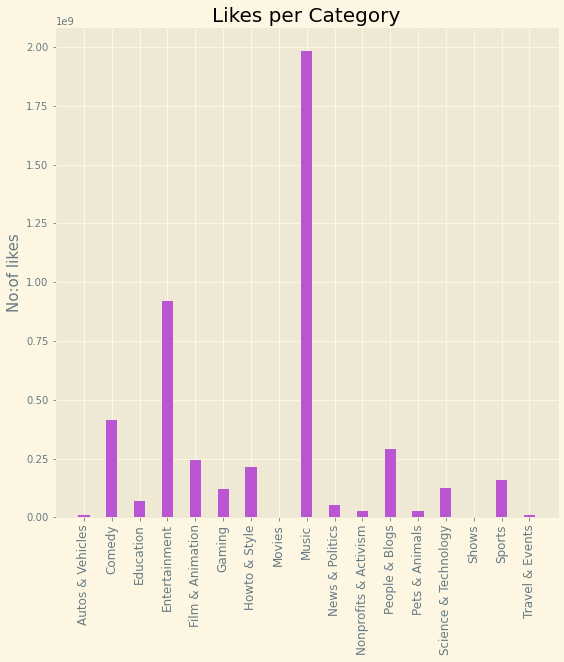

In [41]:
plt.style.use('Solarize_Light2')
plt.figure(figsize=(9,9))
plt.bar(like_data_cat.index,like_data_cat, width = 0.4, color="mediumorchid", label = "Likes")
plt.xticks(like_data_cat.index, rotation="vertical", size=12)
plt.title("Likes per Category", fontsize = 20)
plt.ylabel("No:of likes", fontsize = 15)
plt.show()

#### Box Plot

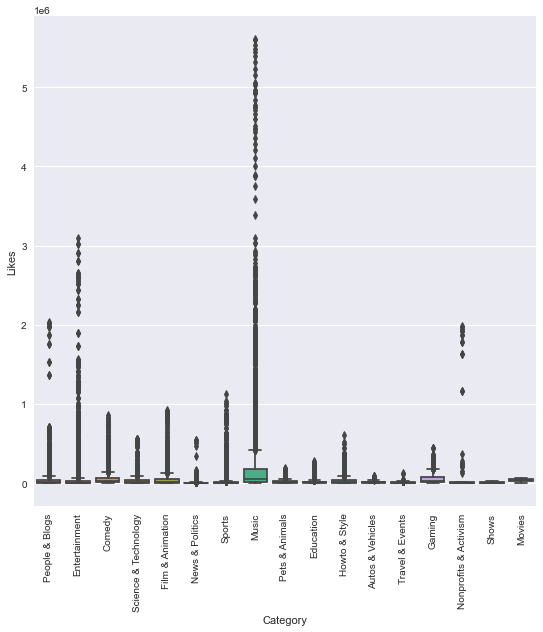

In [42]:
plt.style.use("seaborn")
plt.figure(figsize=(9,9))
sns.boxplot(x = "Category", y = 'likes', data = full_data)
plt.xticks(rotation = "vertical")
plt.ylabel("Likes")
plt.show()

In [43]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [44]:
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=full_data.Category, values=full_data.likes, name="Category Wise Likes"),
              1, 1)
fig.add_trace(go.Pie(labels=full_data.Category, values=full_data.dislikes, name="Category Wise Dislikes"),
              1, 2)

fig.update_traces(hole=.5, hoverinfo="label+percent")

fig.update_layout(
    title_text="Category Wise Likes & Dislikes",
    
    annotations=[dict(text='Likes', x=0.19, y=0.5, font_size=20, showarrow=False),
                 dict(text='Dislikes', x=0.83, y=0.5, font_size=20, showarrow=False)])
fig.show()

### Audience Engagement

#### Creating 3 columns for Like Rate, Dislike Rate & Comment Rate

In [45]:
full_data["Like Rate"] = (full_data["likes"]/full_data["views"])*100
full_data["Dislike Rate"] = (full_data["dislikes"]/full_data["views"])*100
full_data["Comment Rate"] = (full_data["comment_count"]/full_data["views"])*100

In [46]:
full_data

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,...,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,Country,Category,Like Rate,Dislike Rate,Comment Rate
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,...,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,US,People & Blogs,7.686932,0.396326,2.131822
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,...,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",US,Entertainment,4.017930,0.254095,0.525181
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,...,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,US,Comedy,4.575780,0.167292,0.256342
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,...,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...,US,Entertainment,2.964146,0.194074,0.625350
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,...,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,US,Entertainment,6.309732,0.094907,0.835890
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40876,sGolxsMSGfQ,18.14.06,HOW2: How to Solve a Mystery,Annoying Orange,24,2018-06-13T18:00:07.000Z,"annoying orange|""funny""|""fruit""|""talking""|""ani...",80685,1701,99,...,https://i.ytimg.com/vi/sGolxsMSGfQ/default.jpg,False,False,False,🚨 NEW MERCH! http://amzn.to/annoyingorange 🚨➤ ...,CA,Entertainment,2.108199,0.122699,1.626077
40877,8HNuRNi8t70,18.14.06,Eli Lik Lik Episode 13 Partie 01,Elhiwar Ettounsi,24,2018-06-13T19:01:18.000Z,"hkayet tounsia|""elhiwar ettounsi""|""denya okhra...",103339,460,66,...,https://i.ytimg.com/vi/8HNuRNi8t70/default.jpg,False,False,False,► Retrouvez vos programmes préférés : https://...,CA,Entertainment,0.445137,0.063867,0.049352
40878,GWlKEM3m2EE,18.14.06,KINGDOM HEARTS III – SQUARE ENIX E3 SHOWCASE 2...,Kingdom Hearts,20,2018-06-11T17:30:53.000Z,"Kingdom Hearts|""KH3""|""Kingdom Hearts 3""|""Froze...",773347,25900,224,...,https://i.ytimg.com/vi/GWlKEM3m2EE/default.jpg,False,False,False,Find out more about Kingdom Hearts 3: https://...,CA,Gaming,3.349079,0.028965,0.501845
40879,lbMKLzQ4cNQ,18.14.06,Trump Advisor Grovels To Trudeau,The Young Turks,25,2018-06-13T04:00:05.000Z,"180612__TB02SorryExcuse|""News""|""Politics""|""The...",115225,2115,182,...,https://i.ytimg.com/vi/lbMKLzQ4cNQ/default.jpg,False,False,False,Peter Navarro isn’t talking so tough now. Ana ...,CA,News & Politics,1.835539,0.157952,1.451074


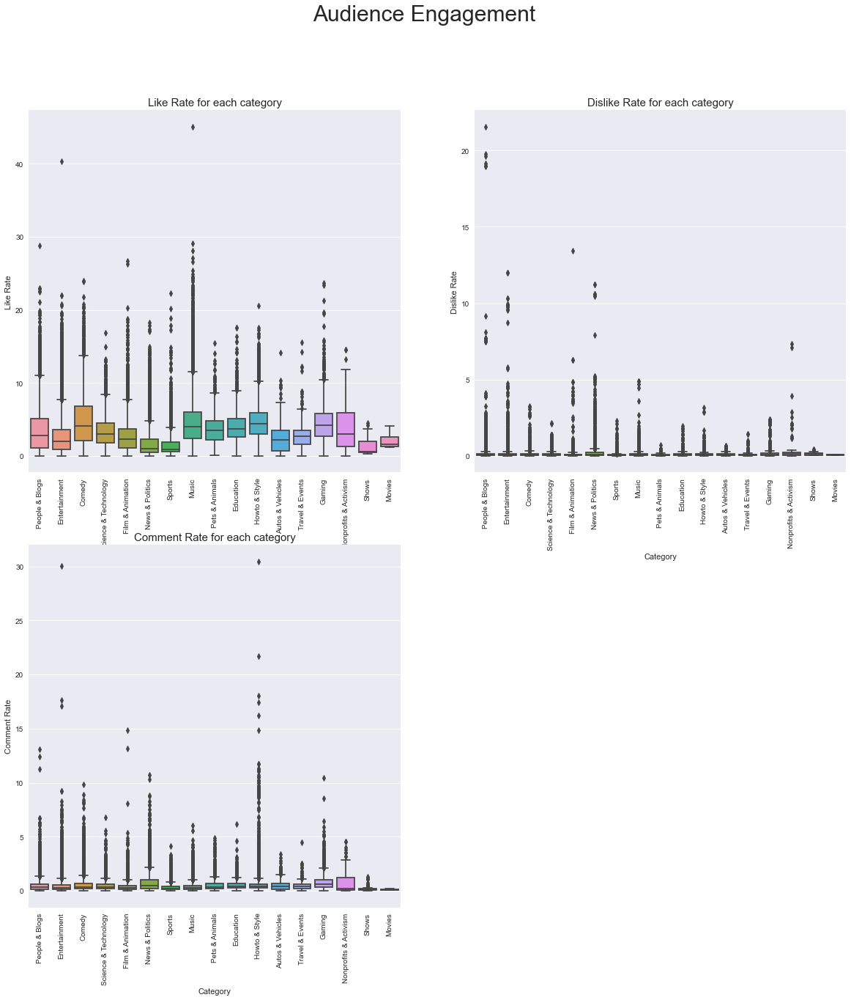

In [47]:
plt.figure(figsize=(20,20))
plt.suptitle("Audience Engagement", fontsize=30)

plt.subplot(2,2,1)
plt.title("Like Rate for each category", fontsize = 15)
sns.boxplot(x = "Category", y = 'Like Rate', data = full_data)
plt.xlabel("Category")
plt.ylabel('Like Rate')
plt.xticks(rotation = "vertical")

plt.subplot(2,2,2)
plt.title("Dislike Rate for each category", fontsize = 15)
sns.boxplot(x = "Category", y = 'Dislike Rate', data = full_data)
plt.xlabel("Category")
plt.ylabel('Dislike Rate')
plt.xticks(rotation = "vertical")

plt.subplot(2,2,3)
plt.title("Comment Rate for each category", fontsize = 15)
sns.boxplot(x = "Category", y = 'Comment Rate', data = full_data)
plt.xlabel("Category")
plt.ylabel('Comment Rate')
plt.xticks(rotation = "vertical")

plt.show()

#### Relation between Views & Likes

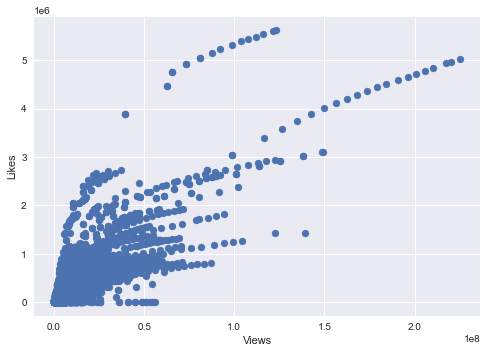

In [48]:
plt.scatter(full_data["views"], full_data["likes"])
plt.ylabel('Likes')
plt.xlabel('Views')
plt.show()

#### Correlation graph

<AxesSubplot:>

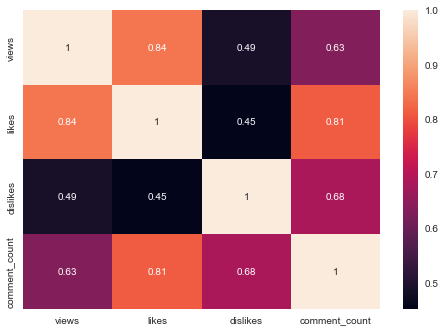

In [49]:
sns.heatmap(full_data[["views","likes","dislikes", "comment_count"]].corr(), annot = True)

#### Top 20 Channels (based on number of videos)

In [50]:
top_channels = full_data.groupby("channel_title").count()["video_id"].sort_values(ascending = False).head(20).to_frame()

In [51]:
top_channels.reset_index(inplace = True)

In [52]:
top_channels.rename(columns = {'channel_title':"Channel Name", 'video_id':'No:of Videos'}, inplace = True)
top_channels

,Channel Name,No:of Videos
0,CNN,362
1,The Late Show with Stephen Colbert,359
2,ESPN,344
3,TheEllenShow,343
4,FBE,337
5,The Tonight Show Starring Jimmy Fallon,334
6,Late Night with Seth Meyers,331
7,Jimmy Kimmel Live,330
8,BuzzFeedVideo,329
9,Vox,326


#### Total no:of likes for top 20 channels

In [53]:
topchannel_likes = full_data[full_data['channel_title'].isin(top_channels["Channel Name"])].groupby("channel_title").sum()["likes"]

Text(0, 0.5, 'No:of Likes (in 10 millions)')

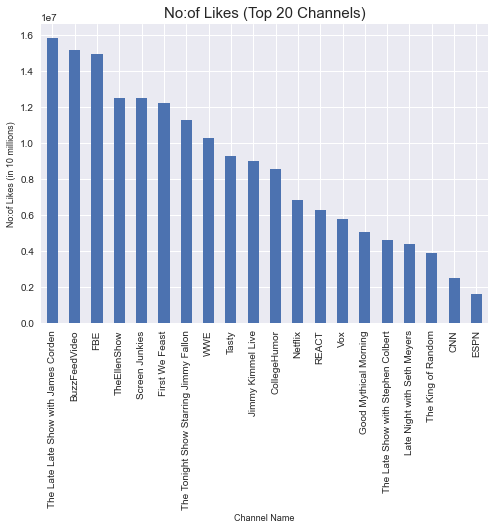

In [54]:
topchannel_likes.sort_values(ascending=False).plot(kind = "bar")
plt.title("No:of Likes (Top 20 Channels)", fontsize = 15)
plt.xlabel('Channel Name', fontsize = 9)
plt.ylabel("No:of Likes (in 10 millions)", fontsize = 9)

In [55]:
full_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 81830 entries, 0 to 40880
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   video_id                81830 non-null  object 
 1   trending_date           81830 non-null  object 
 2   title                   81830 non-null  object 
 3   channel_title           81830 non-null  object 
 4   category_id             81830 non-null  int64  
 5   publish_time            81830 non-null  object 
 6   tags                    81830 non-null  object 
 7   views                   81830 non-null  int64  
 8   likes                   81830 non-null  int64  
 9   dislikes                81830 non-null  int64  
 10  comment_count           81830 non-null  int64  
 11  thumbnail_link          81830 non-null  object 
 12  comments_disabled       81830 non-null  bool   
 13  ratings_disabled        81830 non-null  bool   
 14  video_error_or_removed  81830 non-null

#### No:of views based on hour of uploading

In [56]:
full_data["Uploading Time"] = pd.to_datetime(full_data['publish_time'])

In [57]:
full_data["Hour"] = full_data["Uploading Time"].dt.hour

In [58]:
full_data

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,...,ratings_disabled,video_error_or_removed,description,Country,Category,Like Rate,Dislike Rate,Comment Rate,Uploading Time,Hour
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,...,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,US,People & Blogs,7.686932,0.396326,2.131822,2017-11-13 17:13:01+00:00,17
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,...,False,False,"One year after the presidential election, John...",US,Entertainment,4.017930,0.254095,0.525181,2017-11-13 07:30:00+00:00,7
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,...,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,US,Comedy,4.575780,0.167292,0.256342,2017-11-12 19:05:24+00:00,19
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,...,False,False,Today we find out if Link is a Nickelback amat...,US,Entertainment,2.964146,0.194074,0.625350,2017-11-13 11:00:04+00:00,11
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,...,False,False,I know it's been a while since we did this sho...,US,Entertainment,6.309732,0.094907,0.835890,2017-11-12 18:01:41+00:00,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40876,sGolxsMSGfQ,18.14.06,HOW2: How to Solve a Mystery,Annoying Orange,24,2018-06-13T18:00:07.000Z,"annoying orange|""funny""|""fruit""|""talking""|""ani...",80685,1701,99,...,False,False,🚨 NEW MERCH! http://amzn.to/annoyingorange 🚨➤ ...,CA,Entertainment,2.108199,0.122699,1.626077,2018-06-13 18:00:07+00:00,18
40877,8HNuRNi8t70,18.14.06,Eli Lik Lik Episode 13 Partie 01,Elhiwar Ettounsi,24,2018-06-13T19:01:18.000Z,"hkayet tounsia|""elhiwar ettounsi""|""denya okhra...",103339,460,66,...,False,False,► Retrouvez vos programmes préférés : https://...,CA,Entertainment,0.445137,0.063867,0.049352,2018-06-13 19:01:18+00:00,19
40878,GWlKEM3m2EE,18.14.06,KINGDOM HEARTS III – SQUARE ENIX E3 SHOWCASE 2...,Kingdom Hearts,20,2018-06-11T17:30:53.000Z,"Kingdom Hearts|""KH3""|""Kingdom Hearts 3""|""Froze...",773347,25900,224,...,False,False,Find out more about Kingdom Hearts 3: https://...,CA,Gaming,3.349079,0.028965,0.501845,2018-06-11 17:30:53+00:00,17
40879,lbMKLzQ4cNQ,18.14.06,Trump Advisor Grovels To Trudeau,The Young Turks,25,2018-06-13T04:00:05.000Z,"180612__TB02SorryExcuse|""News""|""Politics""|""The...",115225,2115,182,...,False,False,Peter Navarro isn’t talking so tough now. Ana ...,CA,News & Politics,1.835539,0.157952,1.451074,2018-06-13 04:00:05+00:00,4


In [59]:
time_views = full_data.groupby("Hour").sum()["views"].sort_values(ascending=False).to_frame().reset_index()

In [60]:
time_views

,Hour,views
0,4,12127602410
1,16,10280789550
2,15,9855503519
3,14,9819921492
4,17,8893865289
5,13,8723997074
6,18,7487443957
7,12,6834132794
8,21,6649598151
9,20,6639105720


In [61]:
import plotly.express as px

In [62]:
fig = px.bar(time_views, x="Hour", y="views", title='Hours vs Views', color = 'views')
fig.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        dtick = 1
    )
)

fig.show()

In [63]:
import string

In [64]:
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [65]:
def punc_count(x):
    return len([c for c in x if c in string.punctuation])

In [66]:
punc_count_sample = full_data.copy()

In [67]:
punc_count_sample["No:of punc"] = punc_count_sample["title"].apply(punc_count)

In [68]:
punc_count_sample

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,...,video_error_or_removed,description,Country,Category,Like Rate,Dislike Rate,Comment Rate,Uploading Time,Hour,No:of punc
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,...,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,US,People & Blogs,7.686932,0.396326,2.131822,2017-11-13 17:13:01+00:00,17,0
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,...,False,"One year after the presidential election, John...",US,Entertainment,4.017930,0.254095,0.525181,2017-11-13 07:30:00+00:00,7,3
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,...,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,US,Comedy,4.575780,0.167292,0.256342,2017-11-12 19:05:24+00:00,19,3
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,...,False,Today we find out if Link is a Nickelback amat...,US,Entertainment,2.964146,0.194074,0.625350,2017-11-13 11:00:04+00:00,11,2
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,...,False,I know it's been a while since we did this sho...,US,Entertainment,6.309732,0.094907,0.835890,2017-11-12 18:01:41+00:00,18,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40876,sGolxsMSGfQ,18.14.06,HOW2: How to Solve a Mystery,Annoying Orange,24,2018-06-13T18:00:07.000Z,"annoying orange|""funny""|""fruit""|""talking""|""ani...",80685,1701,99,...,False,🚨 NEW MERCH! http://amzn.to/annoyingorange 🚨➤ ...,CA,Entertainment,2.108199,0.122699,1.626077,2018-06-13 18:00:07+00:00,18,1
40877,8HNuRNi8t70,18.14.06,Eli Lik Lik Episode 13 Partie 01,Elhiwar Ettounsi,24,2018-06-13T19:01:18.000Z,"hkayet tounsia|""elhiwar ettounsi""|""denya okhra...",103339,460,66,...,False,► Retrouvez vos programmes préférés : https://...,CA,Entertainment,0.445137,0.063867,0.049352,2018-06-13 19:01:18+00:00,19,0
40878,GWlKEM3m2EE,18.14.06,KINGDOM HEARTS III – SQUARE ENIX E3 SHOWCASE 2...,Kingdom Hearts,20,2018-06-11T17:30:53.000Z,"Kingdom Hearts|""KH3""|""Kingdom Hearts 3""|""Froze...",773347,25900,224,...,False,Find out more about Kingdom Hearts 3: https://...,CA,Gaming,3.349079,0.028965,0.501845,2018-06-11 17:30:53+00:00,17,0
40879,lbMKLzQ4cNQ,18.14.06,Trump Advisor Grovels To Trudeau,The Young Turks,25,2018-06-13T04:00:05.000Z,"180612__TB02SorryExcuse|""News""|""Politics""|""The...",115225,2115,182,...,False,Peter Navarro isn’t talking so tough now. Ana ...,CA,News & Politics,1.835539,0.157952,1.451074,2018-06-13 04:00:05+00:00,4,0


<AxesSubplot:>

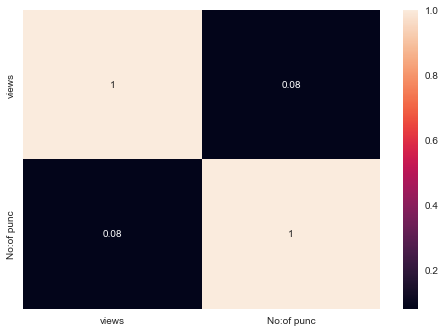

In [69]:
sns.heatmap(punc_count_sample[["views","No:of punc"]].corr(), annot = True)

In [70]:
from datetime import datetime

In [77]:
full_data["Trending Date"] = pd.to_datetime(full_data["trending_date"], format = "%y.%d.%m")

In [81]:
full_data

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,...,description,Country,Category,Like Rate,Dislike Rate,Comment Rate,Uploading Time,Hour,Trending Date,Uploading Date
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,...,SHANTELL'S CHANNEL - https://www.youtube.com/s...,US,People & Blogs,7.686932,0.396326,2.131822,2017-11-13 17:13:01+00:00,17,2017-11-14,2017-11-13
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,...,"One year after the presidential election, John...",US,Entertainment,4.017930,0.254095,0.525181,2017-11-13 07:30:00+00:00,7,2017-11-14,2017-11-13
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,...,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,US,Comedy,4.575780,0.167292,0.256342,2017-11-12 19:05:24+00:00,19,2017-11-14,2017-11-12
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,...,Today we find out if Link is a Nickelback amat...,US,Entertainment,2.964146,0.194074,0.625350,2017-11-13 11:00:04+00:00,11,2017-11-14,2017-11-13
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,...,I know it's been a while since we did this sho...,US,Entertainment,6.309732,0.094907,0.835890,2017-11-12 18:01:41+00:00,18,2017-11-14,2017-11-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40876,sGolxsMSGfQ,18.14.06,HOW2: How to Solve a Mystery,Annoying Orange,24,2018-06-13T18:00:07.000Z,"annoying orange|""funny""|""fruit""|""talking""|""ani...",80685,1701,99,...,🚨 NEW MERCH! http://amzn.to/annoyingorange 🚨➤ ...,CA,Entertainment,2.108199,0.122699,1.626077,2018-06-13 18:00:07+00:00,18,2018-06-14,2018-06-13
40877,8HNuRNi8t70,18.14.06,Eli Lik Lik Episode 13 Partie 01,Elhiwar Ettounsi,24,2018-06-13T19:01:18.000Z,"hkayet tounsia|""elhiwar ettounsi""|""denya okhra...",103339,460,66,...,► Retrouvez vos programmes préférés : https://...,CA,Entertainment,0.445137,0.063867,0.049352,2018-06-13 19:01:18+00:00,19,2018-06-14,2018-06-13
40878,GWlKEM3m2EE,18.14.06,KINGDOM HEARTS III – SQUARE ENIX E3 SHOWCASE 2...,Kingdom Hearts,20,2018-06-11T17:30:53.000Z,"Kingdom Hearts|""KH3""|""Kingdom Hearts 3""|""Froze...",773347,25900,224,...,Find out more about Kingdom Hearts 3: https://...,CA,Gaming,3.349079,0.028965,0.501845,2018-06-11 17:30:53+00:00,17,2018-06-14,2018-06-11
40879,lbMKLzQ4cNQ,18.14.06,Trump Advisor Grovels To Trudeau,The Young Turks,25,2018-06-13T04:00:05.000Z,"180612__TB02SorryExcuse|""News""|""Politics""|""The...",115225,2115,182,...,Peter Navarro isn’t talking so tough now. Ana ...,CA,News & Politics,1.835539,0.157952,1.451074,2018-06-13 04:00:05+00:00,4,2018-06-14,2018-06-13


In [85]:
full_data["Uploading Date"] = full_data["Uploading Time"].dt.date
full_data["Uploading Date"] = pd.to_datetime(full_data["Uploading Date"])

In [101]:
full_data['Date_Diff'] = full_data["Trending Date"] - full_data["Uploading Date"]
full_data['Date_Diff'] = full_data['Date_Diff']/np.timedelta64(1, 'D') # Converting timedelta4 to int

In [102]:
full_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 81830 entries, 0 to 40880
Data columns (total 26 columns):
 #   Column                  Non-Null Count  Dtype              
---  ------                  --------------  -----              
 0   video_id                81830 non-null  object             
 1   trending_date           81830 non-null  object             
 2   title                   81830 non-null  object             
 3   channel_title           81830 non-null  object             
 4   category_id             81830 non-null  int64              
 5   publish_time            81830 non-null  object             
 6   tags                    81830 non-null  object             
 7   views                   81830 non-null  int64              
 8   likes                   81830 non-null  int64              
 9   dislikes                81830 non-null  int64              
 10  comment_count           81830 non-null  int64              
 11  thumbnail_link          81830 non-null  o

In [103]:
full_data

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,...,Country,Category,Like Rate,Dislike Rate,Comment Rate,Uploading Time,Hour,Trending Date,Uploading Date,Date_Diff
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,...,US,People & Blogs,7.686932,0.396326,2.131822,2017-11-13 17:13:01+00:00,17,2017-11-14,2017-11-13,1.0
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,...,US,Entertainment,4.017930,0.254095,0.525181,2017-11-13 07:30:00+00:00,7,2017-11-14,2017-11-13,1.0
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,...,US,Comedy,4.575780,0.167292,0.256342,2017-11-12 19:05:24+00:00,19,2017-11-14,2017-11-12,2.0
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,...,US,Entertainment,2.964146,0.194074,0.625350,2017-11-13 11:00:04+00:00,11,2017-11-14,2017-11-13,1.0
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,...,US,Entertainment,6.309732,0.094907,0.835890,2017-11-12 18:01:41+00:00,18,2017-11-14,2017-11-12,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40876,sGolxsMSGfQ,18.14.06,HOW2: How to Solve a Mystery,Annoying Orange,24,2018-06-13T18:00:07.000Z,"annoying orange|""funny""|""fruit""|""talking""|""ani...",80685,1701,99,...,CA,Entertainment,2.108199,0.122699,1.626077,2018-06-13 18:00:07+00:00,18,2018-06-14,2018-06-13,1.0
40877,8HNuRNi8t70,18.14.06,Eli Lik Lik Episode 13 Partie 01,Elhiwar Ettounsi,24,2018-06-13T19:01:18.000Z,"hkayet tounsia|""elhiwar ettounsi""|""denya okhra...",103339,460,66,...,CA,Entertainment,0.445137,0.063867,0.049352,2018-06-13 19:01:18+00:00,19,2018-06-14,2018-06-13,1.0
40878,GWlKEM3m2EE,18.14.06,KINGDOM HEARTS III – SQUARE ENIX E3 SHOWCASE 2...,Kingdom Hearts,20,2018-06-11T17:30:53.000Z,"Kingdom Hearts|""KH3""|""Kingdom Hearts 3""|""Froze...",773347,25900,224,...,CA,Gaming,3.349079,0.028965,0.501845,2018-06-11 17:30:53+00:00,17,2018-06-14,2018-06-11,3.0
40879,lbMKLzQ4cNQ,18.14.06,Trump Advisor Grovels To Trudeau,The Young Turks,25,2018-06-13T04:00:05.000Z,"180612__TB02SorryExcuse|""News""|""Politics""|""The...",115225,2115,182,...,CA,News & Politics,1.835539,0.157952,1.451074,2018-06-13 04:00:05+00:00,4,2018-06-14,2018-06-13,1.0


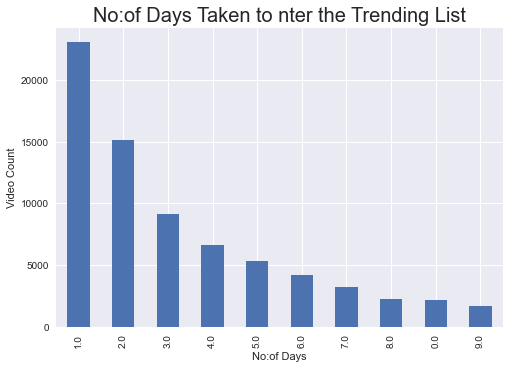

In [141]:
full_data.groupby('Date_Diff').count()["video_id"].sort_values(ascending=False).head(10).plot(kind = "bar",fontsize = 10)
plt.title("No:of Days Taken to enter the Trending List", fontsize = 20)
plt.xlabel("No:of Days")
plt.ylabel("Video Count")
plt.show()